In [ ]:
!pip install ultralytics

In [ ]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

In [ ]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

In [ ]:
# Load a pretrained YOLOv8n model from Ultralytics
model = YOLO('yolov8n.pt')


image 1/1 /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_image.jpg: 384x640 5 cars, 103.2ms
Speed: 15.9ms preprocess, 103.2ms inference, 720.1ms postprocess per image at shape (1, 3, 384, 640)
Number of detected objects: 80


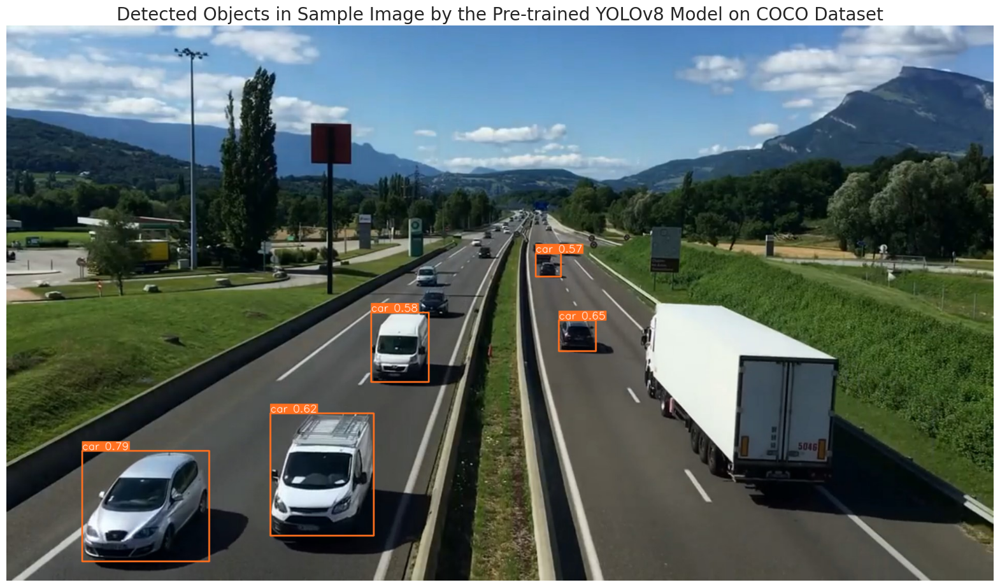

In [ ]:
 #Path to the image file
image_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_image.jpg'

# Perform inference on the provided image(s)
results = model.predict(source=image_path,
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

# Count the number of detected objects
num_objects = len(results[0].names)

# Print the number of detected objects
print("Number of detected objects:", num_objects)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
# Define the dataset_path
dataset_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')
# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- ambulance
- army vehicle
- auto rickshaw
- bicycle
- bus
- car
- garbagevan
- human hauler
- minibus
- minivan
- motorbike
- pickup
- policecar
- rickshaw
- scooter
- suv
- taxi
- three wheelers -CNG-
- truck
- van
- wheelbarrow
nc: 21
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



In [ ]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0
# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()
# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)
            # Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)
# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")
# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")
# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 3240
Number of validation images: 390
Training images have varying sizes.
Validation images have varying sizes.


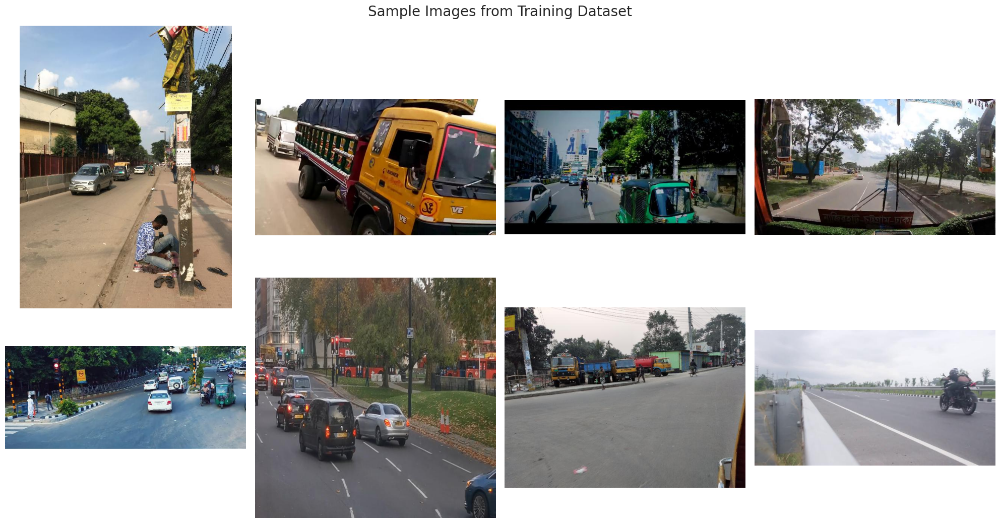

In [ ]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]
# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))
#Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

In [ ]:
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

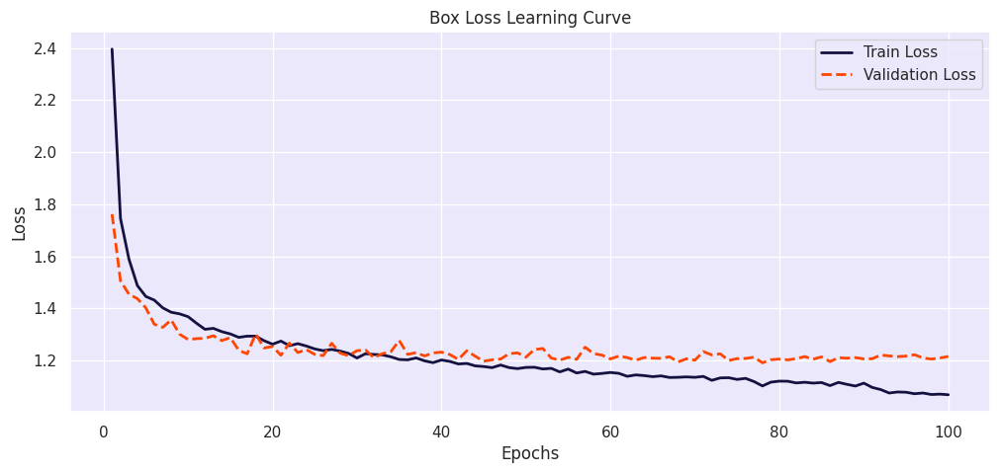

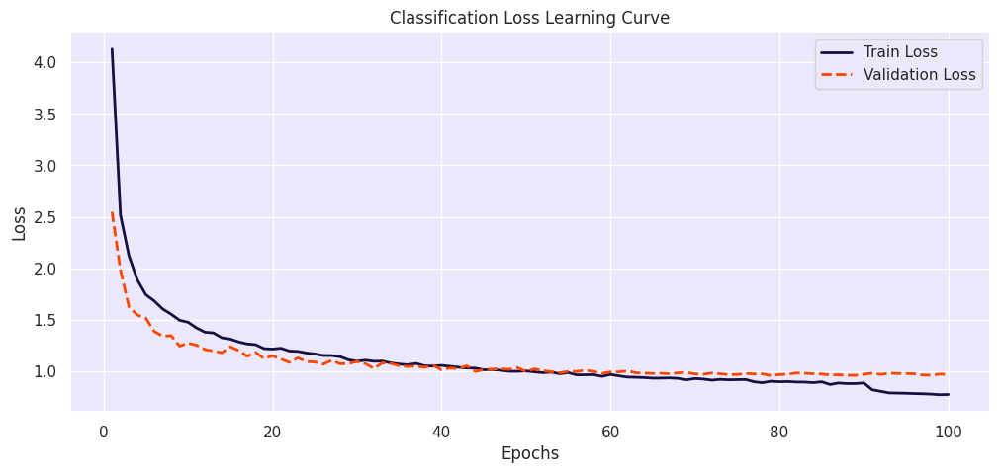

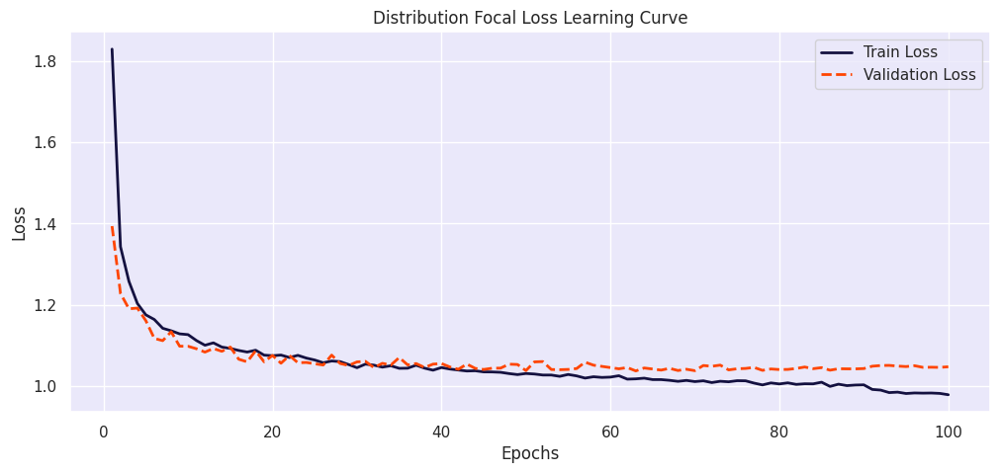

In [ ]:
# Define the path to the directory
post_training_files_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/runs/detect/train'

# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, r'/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/runs/detect/train/results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()
# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

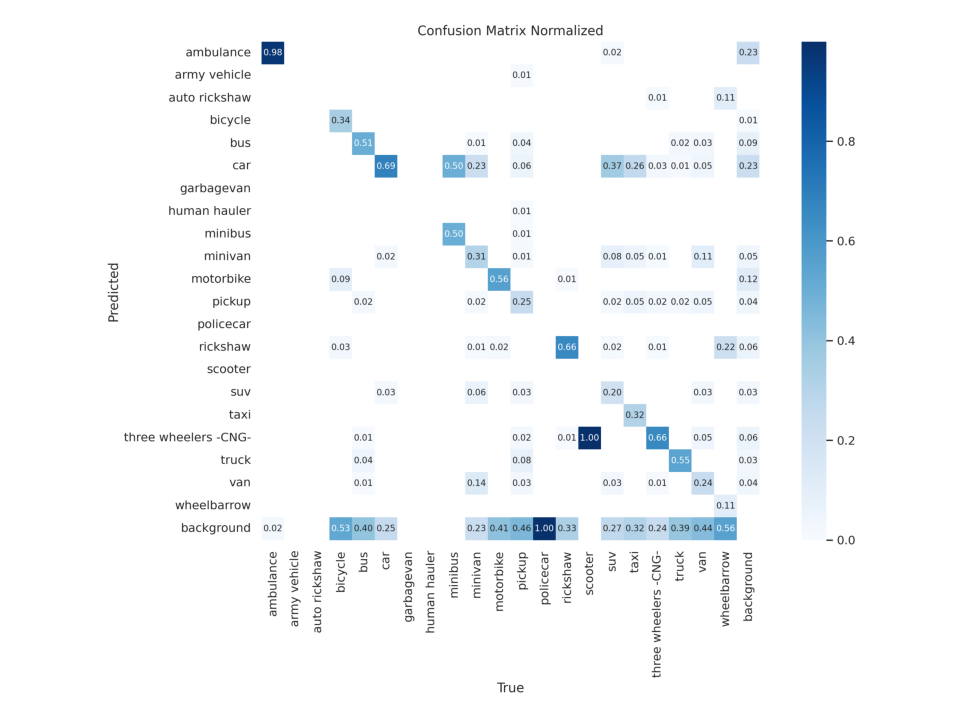

In [ ]:
confusion_matrix_path = os.path.join(post_training_files_path, '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/runs/detect/train/confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)
# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off')
plt.show()

In [ ]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/runs/detect/train/weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3009743 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/labels.cache... 390 images, 0 backgrounds, 9 corrupt: 100%|██████████| 390/390 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/Pias--215-_jpg.rf.ac78e2f098864eb369d892bb2ed93061.jpg: ignoring corrupt image/label: Label class 20 exceeds dataset class count 19. Possible class labels are 0-18
val: WARNING ⚠️ /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/Pias--216-_jpg.rf.b0977e1091616ccad7309ac1a5c6c35f.jpg: ignoring corrupt image/label: Label class 20 exceeds dataset class count 19. Possible class labels are 0-18
val: WARNING ⚠️ /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/Pias--217-_jpg.rf.ae2d08aee91082e437dde21704b3ae87.jpg: ignoring corrupt image/label: Label class 20 exceeds dataset class count 19. Possible class labels are 0-18
val: WARNING ⚠️ /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/Pias--218-_jpg.rf.95d2fdc90d502b3f35119bf4f8d3eabd.jpg: ignoring corrupt image/label: Label class 20 exceeds dataset class count 19. Possibl


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.71it/s]


                   all        381       3394       0.63      0.403      0.444      0.275
             ambulance        381        937      0.842      0.975       0.97      0.725
               bicycle        381         31      0.692      0.323      0.452      0.216
                   bus        381        417      0.766      0.494      0.622      0.398
                   car        381        804      0.736       0.68      0.739      0.492
               minibus        381          1          0          0    0.00315    0.00157
               minivan        381        108      0.495      0.407      0.389      0.279
             motorbike        381        327      0.627      0.483      0.511      0.159
                pickup        381        136      0.509      0.287      0.311      0.188
             policecar        381          1          1          0          0          0
              rickshaw        381        168      0.684      0.657      0.691      0.442
               scoote


image 1/1 /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/11_mp4-28_jpg.rf.afaa0527199e4ac7b9564b9552575d33.jpg: 640x640 13 ambulances, 12.6ms
Speed: 2.1ms preprocess, 12.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/15_mp4-6_jpg.rf.f8ad77cac61af6ee1b551af09789bc24.jpg: 640x640 5 ambulances, 13.6ms
Speed: 1.9ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/6_mp4-31_jpg.rf.c786274ab129629ca618e454b4146f11.jpg: 640x640 3 ambulances, 14.3ms
Speed: 2.0ms preprocess, 14.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/valid/images/Pias--158-_jpg.rf.f7957b68db5e7618e1815d173fe9825a.jpg: 384x640 1 car, 1 three wheelers -CNG-, 23.9ms
Speed: 1

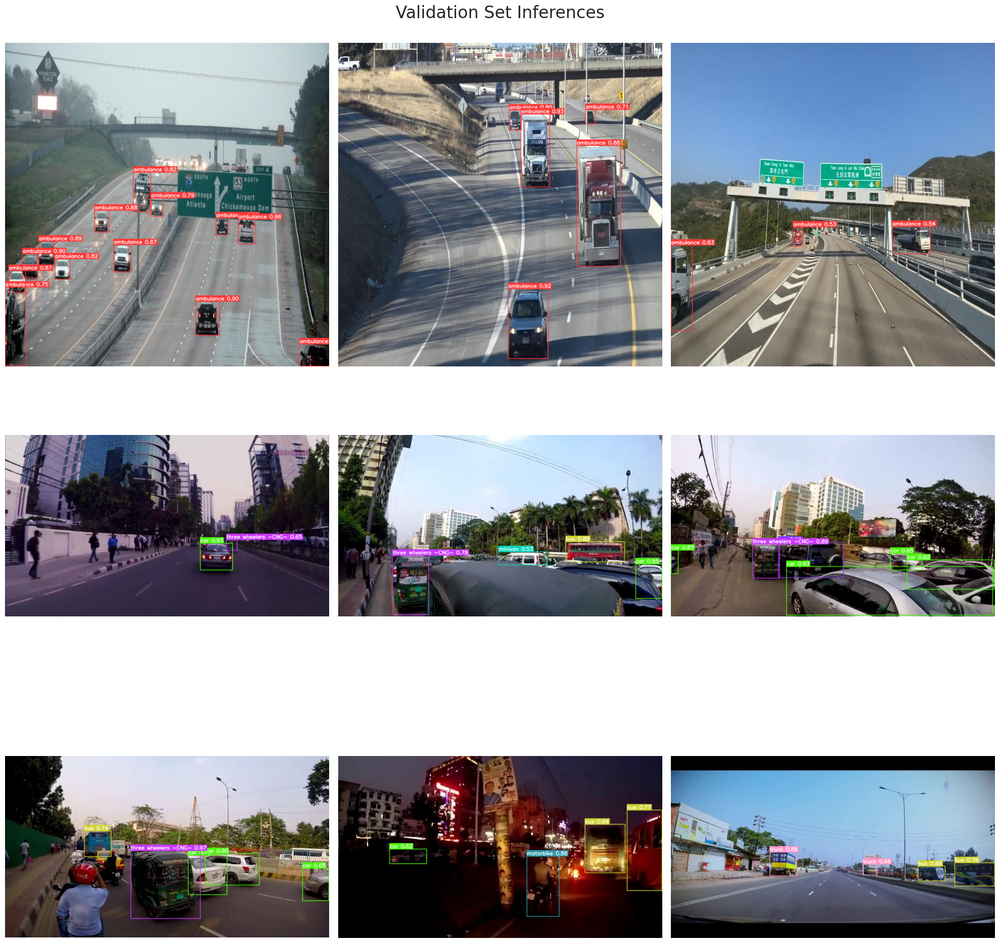

In [ ]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)
# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video.mp4'

# Define the destination path in the working directory
video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy.mp4'
import shutil

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)

"# Define the path to the sample video in the dataset\ndataset_video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video.mp4'\n\n# Define the destination path in the working directory\nvideo_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy.mp4'\nimport shutil\n\n# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing\nshutil.copyfile(dataset_video_path, video_path)\n\n# Initiate vehicle detection on the sample video using the best performing model and save the output\nbest_model.predict(source=video_path, save=True)"

In [ ]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 10

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635
lane_threshold = 609
# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)
# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text
# Open the video
cap = cv2.VideoCapture('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_avi.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))
# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()
         # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame

        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)
        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)
        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0
        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1
        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"
        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25),
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)
        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25),
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25),
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)
        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25),
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)
        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break
# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()'''


'# Define the threshold for considering traffic as heavy\nheavy_traffic_threshold = 10\n\n# Define the vertices for the quadrilaterals\nvertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)\nvertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)\n\n# Define the vertical range for the slice and lane threshold\nx1, x2 = 325, 635 \nlane_threshold = 609\n# Define the positions for the text annotations on the image\ntext_position_left_lane = (10, 50)\ntext_position_right_lane = (820, 50)\nintensity_position_left_lane = (10, 100)\nintensity_position_right_lane = (820, 100)\n# Define font, scale, and colors for the annotations\nfont = cv2.FONT_HERSHEY_SIMPLEX\nfont_scale = 1\nfont_color = (255, 255, 255)    # White color for text\nbackground_color = (0, 0, 255)  # Red background for text\n# Open the video\ncap = cv2.VideoCapture(\'/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video.mp4\')\n\n# Define the c

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video2.mp4'

# Define the destination path in the working directory
video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy2.mp4'
import shutil

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/382) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy2.mp4: 384x640 1 army vehicle, 19 cars, 1 minivan, 1 pickup, 6 suvs, 1 three wheelers -CNG-, 2 vans, 8.1ms
video 1/1 (frame 2/382) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy2.mp4: 384x640 2 army vehicles, 18 cars, 1 minivan, 2 motorbikes, 1 pickup, 5 suvs, 1 three wheelers -CNG-, 2 vans, 8.8ms
video 1/1 (frame 3/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'ambulance', 1: 'army vehicle', 2: 'auto rickshaw', 3: 'bicycle', 4: 'bus', 5: 'car', 6: 'garbagevan', 7: 'human hauler', 8: 'minibus', 9: 'minivan', 10: 'motorbike', 11: 'pickup', 12: 'policecar', 13: 'rickshaw', 14: 'scooter', 15: 'suv', 16: 'taxi', 17: 'three wheelers -CNG-', 18: 'truck', 19: 'van', 20: 'wheelbarrow'}
 obb: None
 orig_img: array([[[ 57,  48,  40],
         [ 62,  53,  45],
         [ 54,  45,  37],
         ...,
         [244, 241, 240],
         [244, 241, 240],
         [244, 241, 240]],
 
        [[ 53,  44,  36],
         [ 56,  47,  39],
         [ 54,  45,  37],
         ...,
         [244, 241, 240],
         [244, 241, 240],
         [244, 241, 240]],
 
        [[ 42,  33,  25],
         [ 43,  34,  26],
         [ 56,  47,  39],
         ...,
         [244, 241, 240],
         [244, 241, 240],
         [244,

In [ ]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 10

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635
lane_threshold = 609
# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)
# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text
# Open the video
cap = cv2.VideoCapture('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video2.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_avi2.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))
# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()
         # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame

        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)
        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)
        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0
        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1
        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"
        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25),
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)
        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25),
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25),
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)
        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25),
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)
        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break
# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()



0: 384x640 1 car, 44.6ms
Speed: 2.2ms preprocess, 44.6ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 41.7ms
Speed: 2.4ms preprocess, 41.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 48.7ms
Speed: 1.6ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 24.0ms
Speed: 3.9ms preprocess, 24.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 35.7ms
Speed: 1.3ms preprocess, 35.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 15.3ms
Speed: 1.4ms preprocess, 15.3ms inference, 8.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 26.8ms
Speed: 1.4ms preprocess, 26.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 23.0ms
Speed: 1.4ms preprocess, 23.0ms inference, 1.8ms postprocess per image at

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video5.mp4'

# Define the destination path in the working directory
video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy5.mp4'
import shutil

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1275) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy5.mp4: 384x640 20 ambulances, 39.3ms
video 1/1 (frame 2/1275) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy5.mp4: 384x640 20 ambulances, 13.5ms
video 1/1 (frame 3/1275) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy5.mp4: 384x640 21 ambulances, 7.9ms
video 1/1 (frame 4/1275) /conte

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'ambulance', 1: 'army vehicle', 2: 'auto rickshaw', 3: 'bicycle', 4: 'bus', 5: 'car', 6: 'garbagevan', 7: 'human hauler', 8: 'minibus', 9: 'minivan', 10: 'motorbike', 11: 'pickup', 12: 'policecar', 13: 'rickshaw', 14: 'scooter', 15: 'suv', 16: 'taxi', 17: 'three wheelers -CNG-', 18: 'truck', 19: 'van', 20: 'wheelbarrow'}
 obb: None
 orig_img: array([[[229, 233, 235],
         [229, 233, 235],
         [229, 233, 235],
         ...,
         [226, 224, 220],
         [226, 224, 220],
         [226, 224, 220]],
 
        [[229, 233, 235],
         [229, 233, 235],
         [229, 233, 235],
         ...,
         [226, 224, 220],
         [226, 224, 220],
         [226, 224, 220]],
 
        [[229, 233, 235],
         [229, 233, 235],
         [229, 233, 235],
         ...,
         [226, 224, 220],
         [226, 224, 220],
         [226,

In [ ]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 10

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635
lane_threshold = 609
# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)
# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text
# Open the video
cap = cv2.VideoCapture('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video5.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_avi5.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))
# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()
         # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame

        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)
        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)
        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0
        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1
        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"
        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25),
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)
        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25),
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25),
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)
        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)
        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25),
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)
        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)
        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break
# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()



0: 384x640 1 bus, 610.6ms
Speed: 77.1ms preprocess, 610.6ms inference, 372.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 716.0ms
Speed: 280.9ms preprocess, 716.0ms inference, 453.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 551.8ms
Speed: 111.6ms preprocess, 551.8ms inference, 269.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 535.0ms
Speed: 116.7ms preprocess, 535.0ms inference, 343.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 4389.5ms
Speed: 303.5ms preprocess, 4389.5ms inference, 101.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 10.4ms
Speed: 17.3ms preprocess, 10.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 8.6ms
Speed: 3.3ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 bus, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 1.4ms postprocess per image at shape (1,

In [ ]:
# Define the path to the sample video in the dataset
dataset_video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video2.mp4'

# Define the destination path in the working directory
video_path = '/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy_2.mp4'
import shutil

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/382) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy_2.mp4: 384x640 1 army vehicle, 19 cars, 1 minivan, 1 pickup, 6 suvs, 1 three wheelers -CNG-, 2 vans, 327.8ms
video 1/1 (frame 2/382) /content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_copy_2.mp4: 384x640 2 army vehicles, 18 cars, 1 minivan, 2 motorbikes, 1 pickup, 5 suvs, 1 three wheelers -CNG-, 2 vans, 9.8ms
video 1/1 (fram

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'ambulance', 1: 'army vehicle', 2: 'auto rickshaw', 3: 'bicycle', 4: 'bus', 5: 'car', 6: 'garbagevan', 7: 'human hauler', 8: 'minibus', 9: 'minivan', 10: 'motorbike', 11: 'pickup', 12: 'policecar', 13: 'rickshaw', 14: 'scooter', 15: 'suv', 16: 'taxi', 17: 'three wheelers -CNG-', 18: 'truck', 19: 'van', 20: 'wheelbarrow'}
 obb: None
 orig_img: array([[[ 57,  48,  40],
         [ 62,  53,  45],
         [ 54,  45,  37],
         ...,
         [244, 241, 240],
         [244, 241, 240],
         [244, 241, 240]],
 
        [[ 53,  44,  36],
         [ 56,  47,  39],
         [ 54,  45,  37],
         ...,
         [244, 241, 240],
         [244, 241, 240],
         [244, 241, 240]],
 
        [[ 42,  33,  25],
         [ 43,  34,  26],
         [ 56,  47,  39],
         ...,
         [244, 241, 240],
         [244, 241, 240],
         [244,

In [ ]:
import cv2
import numpy as np

# Function to detect lane boundaries and adjust quadrilaterals accordingly
def detect_lane_boundaries(frame):
    # Convert the frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Perform edge detection using Canny edge detector
    edges = cv2.Canny(blurred, 50, 150)

    # Define a region of interest for lane detection
    roi = edges[325:635, :]

    # Apply Hough Transform to detect lines in the region of interest
    lines = cv2.HoughLinesP(roi, rho=1, theta=np.pi/180, threshold=100, minLineLength=100, maxLineGap=50)

    # Check if lines were detected
    if lines is None:
        return None, None

    # Initialize variables to store lane boundaries
    left_lane_boundary = []
    right_lane_boundary = []

    # Iterate over the detected lines
    for line in lines:
        x1, y1, x2, y2 = line[0]
        # Calculate slope of the line
        slope = (y2 - y1) / (x2 - x1)
        # Filter lines based on slope and position
        if slope < -0.5 and x1 < 500 and x2 < 500:
            left_lane_boundary.append((x1, y1))
            left_lane_boundary.append((x2, y2))
        elif slope > 0.5 and x1 > 700 and x2 > 700:
            right_lane_boundary.append((x1, y1))
            right_lane_boundary.append((x2, y2))

    return left_lane_boundary, right_lane_boundary

# Open the video
cap = cv2.VideoCapture('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video2.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/drive/MyDrive/Vehicle_Detection_Image_Dataset_updated/sample_video_avi2_a2.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Detect lane boundaries
        left_lane_boundary, right_lane_boundary = detect_lane_boundaries(frame)

        # Check if lane boundaries were detected
        if left_lane_boundary is not None and right_lane_boundary is not None \
                and len(left_lane_boundary) > 0 and len(right_lane_boundary) > 0:
            # Define quadrilaterals based on detected lane boundaries
            vertices1 = np.array([(left_lane_boundary[0][0], 350), (left_lane_boundary[-1][0], 350),
                                (left_lane_boundary[0][0], 630), (2, 630)], dtype=np.int32)
            vertices2 = np.array([(right_lane_boundary[0][0], 350), (right_lane_boundary[-1][0], 350),
                                (right_lane_boundary[0][0], 630), (frame.shape[1], 630)], dtype=np.int32)

            # Draw detected lane boundaries for visualization
            frame_with_lane_boundaries = frame.copy()
            for point in left_lane_boundary:
                cv2.circle(frame_with_lane_boundaries, point, 5, (0, 255, 0), -1)
            for point in right_lane_boundary:
                cv2.circle(frame_with_lane_boundaries, point, 5, (0, 0, 255), -1)

            # Write the processed frame to the output video
            out.write(frame_with_lane_boundaries)

            # Uncomment the following lines if running this code on a local machine to view the real-time processing results
            cv2.imshow('Detected Lane Boundaries', frame_with_lane_boundaries)
            if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
                 break
        else:
            # If lane boundaries were not detected or are empty, skip processing this frame
            continue
    else:
        break

# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()
